## Libraries and packages

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt
import scipy.stats as stats
import statsmodels.api as sm
import plotly.express as px

from math import sqrt
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import root_mean_squared_error

In [2]:
# Parameters to improve default styles of matplotlib and seaborn    
sns.set_style('darkgrid')
matplotlib.rcParams['font.size'] = 14
matplotlib.rcParams['figure.figsize'] = (10, 6)
matplotlib.rcParams['figure.facecolor'] = '#00000000'

## Dataset

In [3]:
df = pd.read_csv('housing.csv')
df.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY


In [4]:
df.shape

(20640, 10)

In [5]:
list(df.columns)

['longitude',
 'latitude',
 'housing_median_age',
 'total_rooms',
 'total_bedrooms',
 'population',
 'households',
 'median_income',
 'median_house_value',
 'ocean_proximity']

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   longitude           20640 non-null  float64
 1   latitude            20640 non-null  float64
 2   housing_median_age  20640 non-null  float64
 3   total_rooms         20640 non-null  float64
 4   total_bedrooms      20433 non-null  float64
 5   population          20640 non-null  float64
 6   households          20640 non-null  float64
 7   median_income       20640 non-null  float64
 8   median_house_value  20640 non-null  float64
 9   ocean_proximity     20640 non-null  object 
dtypes: float64(9), object(1)
memory usage: 1.6+ MB


In [ ]:
df.describe()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
count,20640.000000,20640.000000,20640.000000,20640.000000,20433.000000,20640.000000,20640.000000,20640.000000,20640.000000
mean,-119.569704,35.631861,28.639486,2635.763081,537.870553,1425.476744,499.539680,3.870671,206855.816909
std,2.003532,2.135952,12.585558,2181.615252,421.385070,1132.462122,382.329753,1.899822,115395.615874
min,-124.350000,32.540000,1.000000,2.000000,1.000000,3.000000,1.000000,0.499900,14999.000000
25%,-121.800000,33.930000,18.000000,1447.750000,296.000000,787.000000,280.000000,2.563400,119600.000000
50%,-118.490000,34.260000,29.000000,2127.000000,435.000000,1166.000000,409.000000,3.534800,179700.000000
75%,-118.010000,37.710000,37.000000,3148.000000,647.000000,1725.000000,605.000000,4.743250,264725.000000
max,-114.310000,41.950000,52.000000,39320.000000,6445.000000,35682.000000,6082.000000,15.000100,500001.000000


In [8]:
## Target column
df.ocean_proximity.unique()

array(['NEAR BAY', '<1H OCEAN', 'INLAND', 'NEAR OCEAN', 'ISLAND'],
      dtype=object)

## Data Exploration and Visualization

### Missing data

In [9]:
missing_data = df.isnull().sum()
missing_data

longitude               0
latitude                0
housing_median_age      0
total_rooms             0
total_bedrooms        207
population              0
households              0
median_income           0
median_house_value      0
ocean_proximity         0
dtype: int64

In [10]:
missing_percentage = (missing_data/ len(df)) * 100
print(f'Percentage of missing values per column\n {missing_percentage}')

Percentage of missing values per column
 longitude             0.000000
latitude              0.000000
housing_median_age    0.000000
total_rooms           0.000000
total_bedrooms        1.002907
population            0.000000
households            0.000000
median_income         0.000000
median_house_value    0.000000
ocean_proximity       0.000000
dtype: float64


**Since the missing values are in one column and about only 1%, dropping the missing values is the option am taking**

In [ ]:
# Dropping the missing values
df = df.dropna()
df.isnull().sum()

longitude             0
latitude              0
housing_median_age    0
total_rooms           0
total_bedrooms        0
population            0
households            0
median_income         0
median_house_value    0
ocean_proximity       0
dtype: int64

### Visualization

#### Dependent variable

In [12]:

fig = px.histogram(df, x = 'median_house_value', marginal='box', nbins=50, title='Distribution of median house values')
fig.update_layout(bargap=0.1)
fig.show()

#### Independent variables

In [13]:
fig = px.histogram(df, x = 'population', marginal='box', nbins=50, title='Distribution of population')
fig.update_layout(bargap=0.1)
fig.show()

In [14]:
fig = px.histogram(df, x = 'households', marginal='box', nbins=50, title='Distribution of households')
fig.update_layout(bargap=0.1)
fig.show()

In [15]:
fig = px.histogram(df, x = 'median_income', marginal='box', nbins=50, title='Distribution of median_income')
fig.update_layout(bargap=0.1)
fig.show()

In [16]:
fig = px.histogram(df, x = 'housing_median_age', marginal='box', nbins=50, title='Distribution of housing_median_age')
fig.update_layout(bargap=0.1)
fig.show()

In [17]:
fig = px.histogram(df, x = 'longitude', marginal='box', nbins=50, title='Distribution of longitude')
fig.update_layout(bargap=0.1)
fig.show()

In [ ]:
fig = px.histogram(df, x = 'latitude', marginal='box', nbins=50, title='Distribution of latitude')
fig.update_layout(bargap=0.1)
fig.show()

### Relationship

#### Numerical columns

In [19]:
fig = px.scatter(df, x='median_income', y='median_house_value', color='ocean_proximity', opacity=0.8, title='median_income vs. median_house_value')
fig.update_traces(marker_size=5)
fig.show()

In [20]:
fig = px.scatter(df, x='households', y='median_house_value', color='ocean_proximity', opacity=0.8, title='households vs. median_house_value')
fig.update_traces(marker_size=5)
fig.show()

In [21]:
fig = px.scatter(df, x='population', y='median_house_value', color='ocean_proximity', opacity=0.8, title='population vs. median_house_value')
fig.update_traces(marker_size=5)
fig.show()

In [22]:
fig = px.scatter(df, x='total_bedrooms', y='median_house_value', color='ocean_proximity', opacity=0.8, title='total_bedrooms vs. median_house_value')
fig.update_traces(marker_size=5)
fig.show()

In [23]:
fig = px.scatter(df, x='total_rooms', y='median_house_value', color='ocean_proximity', opacity=0.8, title='total_rooms vs. median_house_value')
fig.update_traces(marker_size=5)
fig.show()

In [24]:
fig = px.scatter(df, x='housing_median_age', y='median_house_value', color='ocean_proximity', opacity=0.8, title='housing_median_age vs. median_house_value')
fig.update_traces(marker_size=5)
fig.show()

In [25]:
fig = px.scatter(df, x='longitude', y='median_house_value', color='ocean_proximity', opacity=0.8, title='longitude vs. median_house_value')
fig.update_traces(marker_size=5)
fig.show()

In [26]:
fig = px.scatter(df, x='latitude', y='median_house_value', color='ocean_proximity', opacity=0.8, title='latitude vs. median_house_value')
fig.update_traces(marker_size=5)
fig.show()

#### Categorical column

In [27]:
px.violin(df, x='ocean_proximity', y='median_house_value', title='ocean_proximity vs. median_house_value')

### Correlation

In [28]:
df.median_house_value.corr(df.median_income)

0.6883554753161124

In [29]:
df.median_house_value.corr(df.households)

0.06489354948814167

In [30]:
df.median_house_value.corr(df.population)

-0.02529973228744199

In [31]:
df.median_house_value.corr(df.total_bedrooms)

0.04968618024734591

In [32]:
df.median_house_value.corr(df.total_rooms)

0.13329413480832267

In [33]:
df.median_house_value.corr(df.housing_median_age)

0.10643204687615467

In [34]:
df.median_house_value.corr(df.longitude)

-0.04539821933444485

In [35]:
df.median_house_value.corr(df.latitude)

-0.14463821157621057

In [36]:
df.median_house_value.corr(df.ocean_proximity.map({'NEAR BAY': 1, '<1H OCEAN': 2, 'INLAND': 3, 'NEAR OCEAN': 4, 'ISLAND': 5}))

-0.21201376585248444

In [37]:
numeric_cols = df.select_dtypes(include=[np.number])

numeric_cols.corr()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
longitude,1.000000,-0.924616,-0.109357,0.045480,0.069608,0.100270,0.056513,-0.015550,-0.045398
latitude,-0.924616,1.000000,0.011899,-0.036667,-0.066983,-0.108997,-0.071774,-0.079626,-0.144638
housing_median_age,-0.109357,0.011899,1.000000,-0.360628,-0.320451,-0.295787,-0.302768,-0.118278,0.106432
total_rooms,0.045480,-0.036667,-0.360628,1.000000,0.930380,0.857281,0.918992,0.197882,0.133294
total_bedrooms,0.069608,-0.066983,-0.320451,0.930380,1.000000,0.877747,0.979728,-0.007723,0.049686
population,0.100270,-0.108997,-0.295787,0.857281,0.877747,1.000000,0.907186,0.005087,-0.025300
households,0.056513,-0.071774,-0.302768,0.918992,0.979728,0.907186,1.000000,0.013434,0.064894
median_income,-0.015550,-0.079626,-0.118278,0.197882,-0.007723,0.005087,0.013434,1.000000,0.688355
median_house_value,-0.045398,-0.144638,0.106432,0.133294,0.049686,-0.025300,0.064894,0.688355,1.000000


Text(0.5, 1.0, 'Correlation Heatmap')

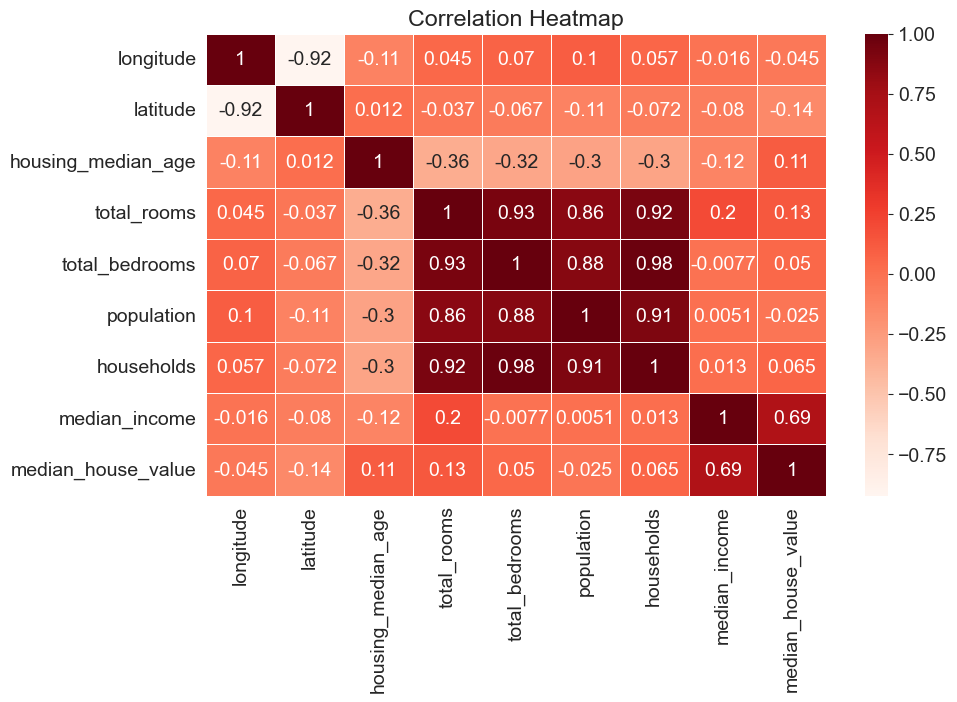

In [38]:
# Confusion matrix
sns.heatmap(numeric_cols.corr(), annot=True, cmap='Reds', linewidths=0.5)
plt.title('Correlation Heatmap')